# Clustering provinces based on retail footprint

**By: Linh Bao Pham**

In this notebook, we will look at the data per each province, review the number of stores and other statistics to clustering and understand the current retail footprint in Vietnam

## 1. Load and count the number of stores for province

In [2]:
import pandas as pd
load={'vinmart':'supermarket',
      'vinplus':'cvs',
      '7eleven':'cvs',
      'coop':'supermarket',
      'coopsmile':'cvs',
      'bigc':'supermarket',
      'bhx':'supermarket',
      'ministop':'cvs',
      'circlek':'cvs'}
#load=('vinmart','vinplus','7eleven','coop','coopsmile','bigc','bhx','ministop','circlek')
f_df=pd.DataFrame()
for i in load.keys():
    path='/Users/lbpham/IBMDS_data/processdata/'+i+'_p.csv'
    tem = pd.read_csv(path)
    tem=tem[['store_name','province','lat','lng','address','address_geo']]
    tem['brand']=i
    tem['type']=load[i]
    print(i, ' has:', tem.shape[0], ' stores')
    f_df=f_df.append(tem,ignore_index=True)

print(f_df.shape)
f_df.tail()

vinmart  has: 74  stores
vinplus  has: 2870  stores
7eleven  has: 30  stores
coop  has: 128  stores
coopsmile  has: 95  stores
bigc  has: 35  stores
bhx  has: 1179  stores
ministop  has: 141  stores
circlek  has: 389  stores
(4941, 8)


,store_name,province,lat,lng,address,address_geo,brand,type
4936,67 Hang Trong Hang Trong Ward Hoan Kiem Distri...,Ha Noi,21.029968,105.850124,67 Hang Trong Hang Trong Ward Hoan Kiem Distri...,"Circle K, Phố Hàng Trống, Khu phố cổ, Hàng Gai...",circlek,cvs
4937,35 Luong Ngoc Quyen Hang Buom Ward Hoan Kiem D...,Ha Noi,21.034665,105.852496,35 Luong Ngoc Quyen Hang Buom Ward Hoan Kiem D...,NaN,circlek,cvs
4938,186 Thai Thinh Lang Ha Ward Dong Da District H...,Ha Noi,21.013368,105.815750,186 Thai Thinh Lang Ha Ward Dong Da District H...,"188, Phố Thái Thịnh, Đống Đa, Hà Nội, Quận Đố...",circlek,cvs
4939,5 - 4A Trung Yen Urban Area Yen Hoa Ward Cau G...,Ha Noi,21.017186,105.799085,5 - 4A Trung Yen Urban Area Yen Hoa Ward Cau G...,"Pizza Hut Trung Hòa, 146, Phố Trung Hòa, Hà Nộ...",circlek,cvs
4940,36 Hai Ba Trung Ben Nghe Ward District 1 Ho Ch...,Ho Chi Minh,10.776861,106.704669,36 Hai Ba Trung Ben Nghe Ward District 1 Ho Ch...,"Saigon Heritage SPA, Hai Bà Trưng, Phường Bến ...",circlek,cvs


In [3]:
# Check for duplicate records in the data:
df=f_df.copy()
df['check']=f_df.duplicated(keep=False)
print('Number of stores: ',df.shape[0])
df.loc[df.check==True]

Number of stores:  4941


,store_name,province,lat,lng,address,address_geo,brand,type,check
613,VM+ LCI Số 003 Soi Tiền,Lao Cai,22.495108,103.969282,"Số 003 Soi Tiền, Phường Cốc Lếu, Thành phố Lào...","Vegan restaurant, Đường Hồng Hà, Cốc Lếu, Lào ...",vinplus,cvs,True
614,VM+ LCI Số 003 Soi Tiền,Lao Cai,22.495108,103.969282,"Số 003 Soi Tiền, Phường Cốc Lếu, Thành phố Lào...","Vegan restaurant, Đường Hồng Hà, Cốc Lếu, Lào ...",vinplus,cvs,True
626,VM+ QBH 31 Hoàng Diệu,Quang Binh,17.467494,106.597968,"31 Hoàng Diệu, Phường Nam Lý, TP Đồng Hới, Quả...","Lươn CHỊ NGẠNH, 18, Hoàng Diệu, Đồng Hới, Tỉnh...",vinplus,cvs,True
627,VM+ QBH 31 Hoàng Diệu,Quang Binh,17.467494,106.597968,"31 Hoàng Diệu, Phường Nam Lý, TP Đồng Hới, Quả...","Lươn CHỊ NGẠNH, 18, Hoàng Diệu, Đồng Hới, Tỉnh...",vinplus,cvs,True
633,VM+ NAN 7 Nguyễn Quốc Trị,Nghe An,18.682134,105.679684,"7 Nguyễn Quốc Trị, Phường Hưng Bình, TP Vinh, ...","Trung Đô, P. Hưng Bình, Thành phố Vinh, Tỉnh N...",vinplus,cvs,True
634,VM+ NAN 7 Nguyễn Quốc Trị,Nghe An,18.682134,105.679684,"7 Nguyễn Quốc Trị, Phường Hưng Bình, TP Vinh, ...","Trung Đô, P. Hưng Bình, Thành phố Vinh, Tỉnh N...",vinplus,cvs,True
637,VM+ NDH 182 Song Hào,Nam Dinh,20.411592,106.165094,"182 Song Hào, Phường Văn Miếu, TP Nam Định, Tỉ...","Nam Định, Tỉnh Nam Định, 400000, Việt Nam",vinplus,cvs,True
638,VM+ NDH 182 Song Hào,Nam Dinh,20.411592,106.165094,"182 Song Hào, Phường Văn Miếu, TP Nam Định, Tỉ...","Nam Định, Tỉnh Nam Định, 400000, Việt Nam",vinplus,cvs,True
4550,MINISTOP - Khu B Đại Học Quốc Gia,Binh Duong,106.806210,10.878231,"Quốc lộ 1A, Khu B, Kí túc xá Đại học Quốc Gia,...",NaN,ministop,cvs,True
4551,MINISTOP - Khu B Đại Học Quốc Gia,Binh Duong,106.806210,10.878231,"Quốc lộ 1A, Khu B, Kí túc xá Đại học Quốc Gia,...",NaN,ministop,cvs,True


In [4]:
#Remove the duplicate records
df['check']=f_df.duplicated(keep='first')
print('Index of duplicated records: ',df.loc[df.check==True].index)
df=df.drop(df.loc[df.check==True].index)
print('Number of stores after remove duplicate: ',df.shape[0])
df.tail()

Index of duplicated records:  Int64Index([614, 627, 634, 638, 4551], dtype='int64')
Number of stores after remove duplicate:  4936


,store_name,province,lat,lng,address,address_geo,brand,type,check
4936,67 Hang Trong Hang Trong Ward Hoan Kiem Distri...,Ha Noi,21.029968,105.850124,67 Hang Trong Hang Trong Ward Hoan Kiem Distri...,"Circle K, Phố Hàng Trống, Khu phố cổ, Hàng Gai...",circlek,cvs,False
4937,35 Luong Ngoc Quyen Hang Buom Ward Hoan Kiem D...,Ha Noi,21.034665,105.852496,35 Luong Ngoc Quyen Hang Buom Ward Hoan Kiem D...,NaN,circlek,cvs,False
4938,186 Thai Thinh Lang Ha Ward Dong Da District H...,Ha Noi,21.013368,105.815750,186 Thai Thinh Lang Ha Ward Dong Da District H...,"188, Phố Thái Thịnh, Đống Đa, Hà Nội, Quận Đố...",circlek,cvs,False
4939,5 - 4A Trung Yen Urban Area Yen Hoa Ward Cau G...,Ha Noi,21.017186,105.799085,5 - 4A Trung Yen Urban Area Yen Hoa Ward Cau G...,"Pizza Hut Trung Hòa, 146, Phố Trung Hòa, Hà Nộ...",circlek,cvs,False
4940,36 Hai Ba Trung Ben Nghe Ward District 1 Ho Ch...,Ho Chi Minh,10.776861,106.704669,36 Hai Ba Trung Ben Nghe Ward District 1 Ho Ch...,"Saigon Heritage SPA, Hai Bà Trưng, Phường Bến ...",circlek,cvs,False


In [5]:
# finalize the data for clustering
df=df.reset_index()
df=df.drop(columns=('index'))
df.head()

,store_name,province,lat,lng,address,address_geo,brand,type,check
0,VinMart Tĩnh Gia,Thanh Hoa,19.436762,105.772977,"Tầng 1, TTTM Vincom+ Tinh Gia, xã Nguyên Bình,...","Petrolimex, Quốc lộ 1A, Tĩnh Gia, Thanh Hóa, V...",vinmart,supermarket,False
1,VinMart Trung Hòa,Ha Noi,21.007492,105.802041,"Tầng hầm B1, N05, KĐT Trung Hòa Nhân Chính, P....","VinMart Hoang Dao Thuy, Phố Hoàng Đạo Thúy, Hà...",vinmart,supermarket,False
2,VinMart Thăng Long A,Ha Noi,20.998448,105.721489,Khu đô thị vinhomes Thăng Long,"Vm+ vinhomes thăng long kdt nam an khánh, Long...",vinmart,supermarket,False
3,VinMart Phú Yên,Phu Yen,13.100831,109.308986,Góc Đông Bắc ngã tư đường Hùng Vương và Trần ...,"Trung Tâm Thương mại Vincom Phú Yên - CGV, Vòn...",vinmart,supermarket,False
4,VinMart Kỳ Anh,Ha Tinh,18.241776,106.096172,"Vincom+ Kỳ Anh, Tổ dân phố 1, Phường Sông Trí,...","Cẩm Xuyên, Hà Tĩnh, Việt Nam",vinmart,supermarket,False


In [6]:
# Create uniqueid for each store
for i in range(len(df)):
    df.loc[i,'store_id']=df.loc[i,'brand']+str(i)
df.head()

,store_name,province,lat,lng,address,address_geo,brand,type,check,store_id
0,VinMart Tĩnh Gia,Thanh Hoa,19.436762,105.772977,"Tầng 1, TTTM Vincom+ Tinh Gia, xã Nguyên Bình,...","Petrolimex, Quốc lộ 1A, Tĩnh Gia, Thanh Hóa, V...",vinmart,supermarket,False,vinmart0
1,VinMart Trung Hòa,Ha Noi,21.007492,105.802041,"Tầng hầm B1, N05, KĐT Trung Hòa Nhân Chính, P....","VinMart Hoang Dao Thuy, Phố Hoàng Đạo Thúy, Hà...",vinmart,supermarket,False,vinmart1
2,VinMart Thăng Long A,Ha Noi,20.998448,105.721489,Khu đô thị vinhomes Thăng Long,"Vm+ vinhomes thăng long kdt nam an khánh, Long...",vinmart,supermarket,False,vinmart2
3,VinMart Phú Yên,Phu Yen,13.100831,109.308986,Góc Đông Bắc ngã tư đường Hùng Vương và Trần ...,"Trung Tâm Thương mại Vincom Phú Yên - CGV, Vòn...",vinmart,supermarket,False,vinmart3
4,VinMart Kỳ Anh,Ha Tinh,18.241776,106.096172,"Vincom+ Kỳ Anh, Tổ dân phố 1, Phường Sông Trí,...","Cẩm Xuyên, Hà Tĩnh, Việt Nam",vinmart,supermarket,False,vinmart4


In [7]:
print('Number of stores from major retail chains in Vietnam: ', df.shape[0])

Number of stores from major retail chains in Vietnam:  4936


In [102]:
name=('store_name','province','address','address_geo','brand')
for i in name:
    df[i]=df[i].astype(str)
df.dtypes

store_name      object
province        object
lat            float64
lng            float64
address         object
address_geo     object
brand           object
type            object
check             bool
store_id        object
dtype: object

## 2. Counting the stores per province

In [8]:
#count number of store per each type
storetype=df.type.unique()

for i in range(len(storetype)):
    name=storetype[i]
    data=df.loc[df.type==name]
    count=pd.DataFrame(data.groupby('province')['store_id'].nunique())
    count=count.reset_index()
    count.columns=['province','countstores']
    count['province']=count['province'].str.replace(' - ',' ')
count.head()

,province,countstores
0,An Giang,83
1,Ba Ria Vung Tau,92
2,Bac Giang,18
3,Bac Lieu,27
4,Bac Ninh,41


# 3. Loading province data and create dataset for clustering

In [9]:
path='/Users/lbpham/IBMDS_data/processdata/province_p.csv'
province=pd.read_csv(path)
province.head()

,Unnamed: 0,province,vndperp,usdperp,population,area,density,cen_dis,urban,hdi,gdppp,region,lat,lng
0,0,Ha Noi,93.94,4080.0,8053663.0,3358.9,2398.0,Hoan Kiem District,41.0,0.794,3923.21,Red River Delta,21.029450,105.854444
1,1,Vinh Phuc,86.50,3757.0,1154154.0,1235.2,934.0,Vinh Yen,22.4,0.764,3990.61,Red River Delta,21.311356,105.603294
2,2,Bac Ninh,150.10,6519.0,1368840.0,822.7,1664.0,Bac Ninh,23.5,0.771,4451.41,Red River Delta,21.121205,106.088025
3,3,Quang Ninh,117.66,5110.0,1320324.0,6177.7,214.0,Ha Long,51.9,0.784,7834.55,Northeast,10.043497,105.782998
4,4,Hai Duong,56.30,2445.0,1705059.0,1668.2,1022.0,Hai Duong,19.0,0.746,2513.92,Red River Delta,20.944368,106.378037


In [110]:
#count number of store per each type
storetype=df.type.unique()
data=province.copy()
data['countstores']=0
for i in range(len(storetype)):
    name=storetype[i]
    count=df.loc[df.type==name]
    count=pd.DataFrame(count.groupby('province')['store_id'].nunique())
    count=count.reset_index()
    count.columns=['province',name]
    count['province']=count['province'].str.replace(' - ',' ')
    data=pd.merge(left=data,right=count,left_on='province',right_on='province',how='left')
    data[name] = data[name].fillna(0)
    data['countstores']=data['countstores']+data[name]

data=data.drop(columns=['Unnamed: 0'])
data.head()

,province,vndperp,usdperp,population,area,density,cen_dis,urban,hdi,gdppp,region,lat,lng,countstores,supermarket,cvs
0,Ha Noi,93.94,4080.0,8053663.0,3358.9,2398.0,Hoan Kiem District,41.0,0.794,3923.21,Red River Delta,21.029450,105.854444,1000.0,33.0,967.0
1,Vinh Phuc,86.50,3757.0,1154154.0,1235.2,934.0,Vinh Yen,22.4,0.764,3990.61,Red River Delta,21.311356,105.603294,27.0,2.0,25.0
2,Bac Ninh,150.10,6519.0,1368840.0,822.7,1664.0,Bac Ninh,23.5,0.771,4451.41,Red River Delta,21.121205,106.088025,41.0,0.0,41.0
3,Quang Ninh,117.66,5110.0,1320324.0,6177.7,214.0,Ha Long,51.9,0.784,7834.55,Northeast,10.043497,105.782998,79.0,3.0,76.0
4,Hai Duong,56.30,2445.0,1705059.0,1668.2,1022.0,Hai Duong,19.0,0.746,2513.92,Red River Delta,20.944368,106.378037,31.0,3.0,28.0


In [111]:
# check for number of store after merging:
print('Number of stores after remove duplicate: ', df.shape[0])
print('Number of stores counted in province :', sum(data['countstores']))

Number of stores after remove duplicate:  4936
Number of stores counted in province : 4936.0


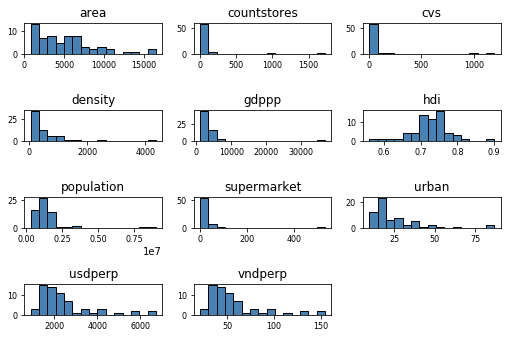

In [112]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib as mpl
import numpy as np
import seaborn as sns

tem=data.copy()
tem=tem.drop(columns=['lat','lng',])

tem.hist(bins=15, color='steelblue', edgecolor='black', linewidth=1.0,
          xlabelsize=8, ylabelsize=8, grid=False)    
plt.tight_layout(rect=(0, 0, 1.2, 1.2))

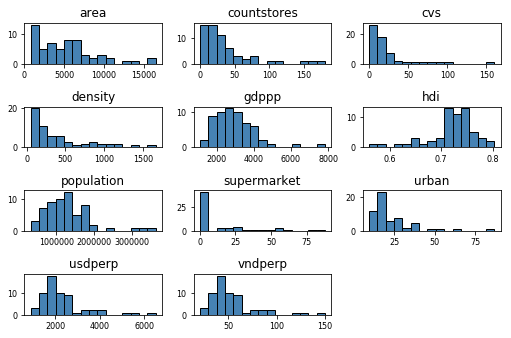

In [113]:
tem=data.copy()
tem=tem.drop([0,48,62])
tem=tem.drop(columns=['lat','lng',])
tem.hist(bins=15, color='steelblue', edgecolor='black', linewidth=1.0,
          xlabelsize=8, ylabelsize=8, grid=False)    
plt.tight_layout(rect=(0, 0, 1.2, 1.2))

In [154]:
import matplotlib.pyplot as plt

tem=data.copy()
tem=tem.drop(columns=['lat','lng',])

# Review covariance between attribute (including all data points)
corr_matrix=tem.corr()
corr_matrix.style.background_gradient(cmap='coolwarm')

,vndperp,usdperp,population,area,density,urban,hdi,gdppp,countstores,supermarket,cvs
vndperp,1,0.99999,0.485832,-0.355479,0.638169,0.613927,0.683097,0.5189,0.535902,0.496963,0.515387
usdperp,0.99999,1,0.48568,-0.355059,0.637992,0.614678,0.683256,0.518998,0.535964,0.497104,0.515417
population,0.485832,0.48568,1,-0.0340436,0.791509,0.394397,0.390087,0.0843305,0.901567,0.708208,0.912987
area,-0.355479,-0.355059,-0.0340436,1,-0.481944,-0.191236,-0.511451,-0.18822,-0.173893,-0.182937,-0.159447
density,0.638169,0.637992,0.791509,-0.481944,1,0.464895,0.502106,0.148451,0.856311,0.746843,0.840505
urban,0.613927,0.614678,0.394397,-0.191236,0.464895,1,0.529762,0.392503,0.553907,0.493868,0.539813
hdi,0.683097,0.683256,0.390087,-0.511451,0.502106,0.529762,1,0.601551,0.365833,0.337749,0.352368
gdppp,0.5189,0.518998,0.0843305,-0.18822,0.148451,0.392503,0.601551,1,0.145489,0.161334,0.130429
countstores,0.535902,0.535964,0.901567,-0.173893,0.856311,0.553907,0.365833,0.145489,1,0.866054,0.983736
supermarket,0.496963,0.497104,0.708208,-0.182937,0.746843,0.493868,0.337749,0.161334,0.866054,1,0.762168


/Users/lbpham/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:2079: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


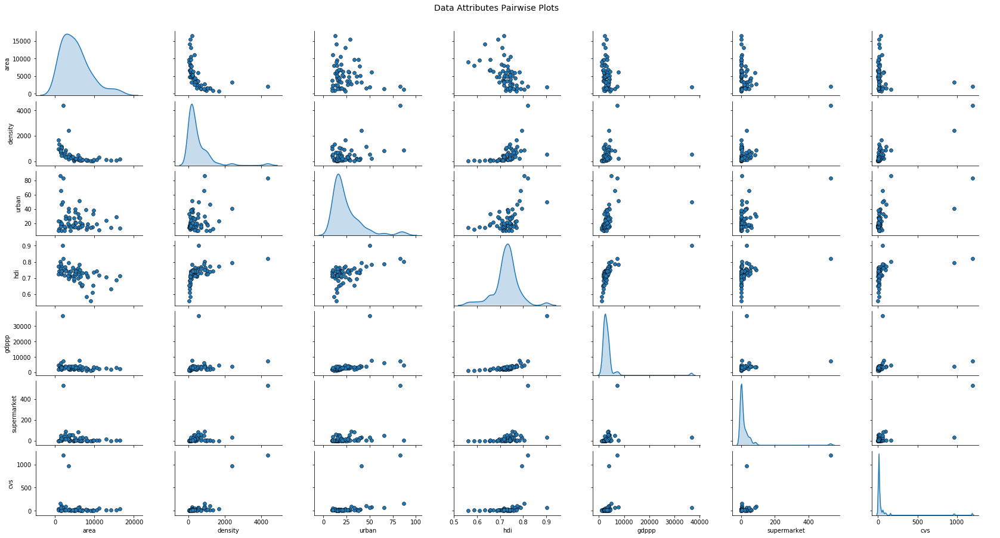

In [151]:
# Pair-wise Scatter Plots (all data points)
cols = ['area', 'density', 'urban', 'hdi','gdppp','supermarket','cvs']
pp = sns.pairplot(data[cols], size=1.8, aspect=1.8,
                  plot_kws=dict(edgecolor="k", linewidth=0.5),
                  diag_kind="kde", diag_kws=dict(shade=True))

fig = pp.fig 
fig.subplots_adjust(top=0.93, wspace=0.3)
t = fig.suptitle('Data Attributes Pairwise Plots', fontsize=14)

/Users/lbpham/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:2079: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


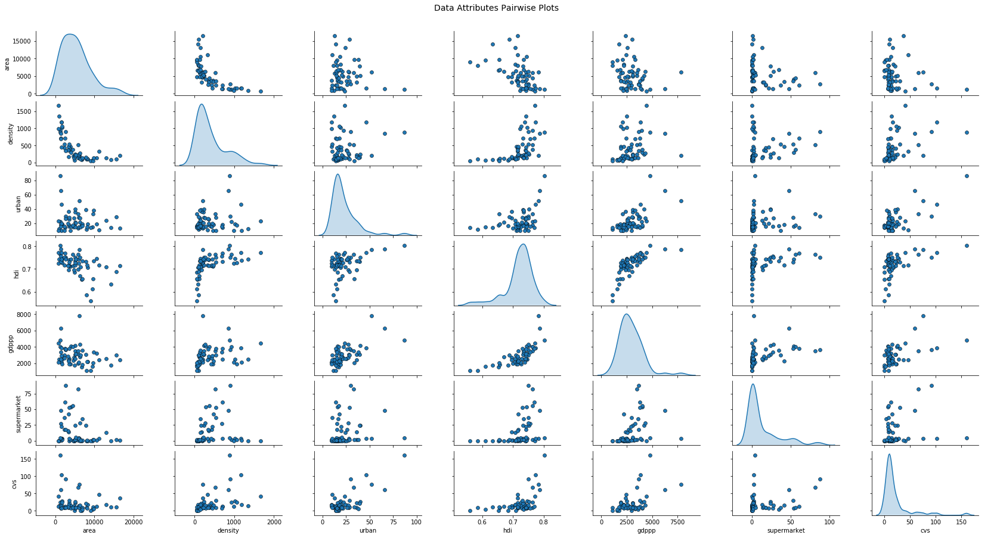

In [155]:
# Pair-wise Scatter Plots (remove the outliers)
tem=data.copy()
tem=tem.drop([0,48,62])
tem=tem.drop(columns=['lat','lng',])

cols = ['area', 'density', 'urban', 'hdi','gdppp','supermarket','cvs']
pp = sns.pairplot(tem[cols], size=1.8, aspect=1.8,
                  plot_kws=dict(edgecolor="k", linewidth=0.5),
                  diag_kind="kde", diag_kws=dict(shade=True))

fig = pp.fig 
fig.subplots_adjust(top=0.93, wspace=0.3)
t = fig.suptitle('Data Attributes Pairwise Plots', fontsize=14)

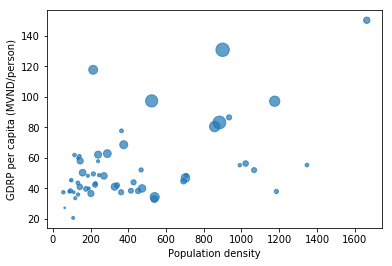

In [124]:
plt.scatter(tem['density'],tem['vndperp'],alpha=0.7, s=tem['countstores'])
#plt.title('Germany price indices (2000-2018)')
plt.xlabel('Population density')
plt.ylabel('GDRP per capita (MVND/person)')
plt.show()

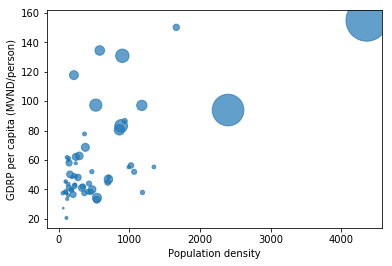

In [125]:
plt.scatter(data['density'],data['vndperp'],alpha=0.7, s=data['countstores'])
#plt.title('Germany price indices (2000-2018)')
plt.xlabel('Population density')
plt.ylabel('GDRP per capita (MVND/person)')
plt.show()

In [56]:
retail=result.copy()

retail['cluster'] = retail['cluster'].astype('category')

#change city name to match json file
retail['json_name']=result['province']
retail.loc[retail.province[retail.province == 'Ho Chi Minh'].index.tolist(),'json_name']='TP. Ho Chi Minh'
retail.loc[retail.province[retail.province == 'Thua Thien Hue'].index.tolist(),'json_name']='Thua Thien - Hue'
retail.loc[retail.province[retail.province == 'Ba Ria Vung Tau'].index.tolist(),'json_name']='Ba Ria - Vung Tau'

import seaborn as sns
import folium
import os
import json
import requests

#address= 'Vietnam'
#geolocator = Nominatim()
#location = geolocator.geocode(address)

vn=folium.Map(location=[13.2904027, 108.4265113],zoom_start=5.2,title='Vietnam')

url = 'https://data.opendevelopmentmekong.net/dataset/999c96d8-fae0-4b82-9a2b-e481f6f50e12/resource/2818c2c5-e9c3-440b-a9b8-3029d7298065/download/diaphantinhenglish.geojson'
vn_geo=json.loads(requests.get(url).text)

vn.choropleth(
    geo_data=vn_geo,
    data=retail,
    columns=['json_name','countstores'],
    key_on='feature.properties.Name',
    fill_color='YlOrRd', 
    fill_opacity=0.75, 
    line_opacity=0.2,
    legend_name='Number of store',
    threshold_scale=[0, 50, 100, 1000, 2000])
vn

In [103]:
# create map of Toronto using latitude and longitude values
vn=folium.Map(location=[13.2904027, 108.4265113],zoom_start=5.2,title='Vietnam')
                    

# create color code for different store type
import random

storetype=df.type.unique()
color={}

for i in range(len(storetype)):
    #print(area[i])
    color[storetype[i]]="#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
    #print(color[area[i]])
    

# add markers to map
import unidecode
storetype=df.type.unique()
for j in range(len(storetype)):
    mark=df.loc[df.type==storetype[j]].reset_index(drop=True)
    
    for i in range(mark.shape[0]):
        brand=mark.loc[i,'brand']
        name=unidecode.unidecode(mark.loc[i,'store_name'])
        lat=mark.loc[i,'lat']
        lng=mark.loc[i,'lng']
        if lat>0:
            label = '{}, {}'.format(brand, name)
            label = folium.Popup(label, parse_html=True)
            folium.CircleMarker([lat, lng],radius=1,popup=label,
                                color=color[storetype[j]],
                                fill=True,
                                fill_color=color[storetype[j]],
                                fill_opacity=0.5,
                                parse_html=False).add_to(vn)  

vn

## Clustering and understanding cluster differences

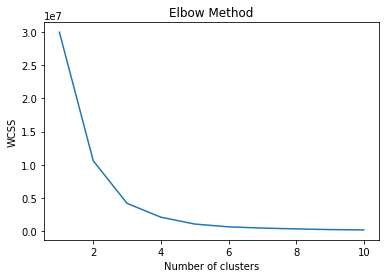

In [171]:
retail=data.copy()

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.datasets.samples_generator import make_blobs
from sklearn.cluster import KMeans

#X=retail.drop(['city','city_id','capital_center','region'], axis=1)
X=retail[['density','urban','hdi','vndperp','cvs','supermarket']]

wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=1000, n_init=10, random_state=0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [139]:
kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=1000, n_init=10, random_state=0)
result=retail.copy()
result['cluster']=kmeans.fit_predict(X)
#result['cluster'] = pd.Categorical(result.cluster)
#retail['cluster'] = kmeans.fit_predict(np.asanyarray(X).reshape(-1, 1))
#retail.head()
result.head()

,province,vndperp,usdperp,population,area,density,cen_dis,urban,hdi,gdppp,region,lat,lng,countstores,supermarket,cvs,cluster,json_name
0,Ha Noi,93.94,4080.0,8053663.0,3358.9,2398.0,Hoan Kiem District,41.0,0.794,3923.21,Red River Delta,21.029450,105.854444,1000.0,33.0,967.0,1,Ha Noi
1,Vinh Phuc,86.50,3757.0,1154154.0,1235.2,934.0,Vinh Yen,22.4,0.764,3990.61,Red River Delta,21.311356,105.603294,27.0,2.0,25.0,2,Vinh Phuc
2,Bac Ninh,150.10,6519.0,1368840.0,822.7,1664.0,Bac Ninh,23.5,0.771,4451.41,Red River Delta,21.121205,106.088025,41.0,0.0,41.0,2,Bac Ninh
3,Quang Ninh,117.66,5110.0,1320324.0,6177.7,214.0,Ha Long,51.9,0.784,7834.55,Northeast,10.043497,105.782998,79.0,3.0,76.0,0,Quang Ninh
4,Hai Duong,56.30,2445.0,1705059.0,1668.2,1022.0,Hai Duong,19.0,0.746,2513.92,Red River Delta,20.944368,106.378037,31.0,3.0,28.0,2,Hai Duong


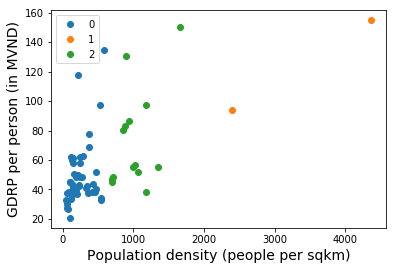

In [140]:
import seaborn as sns

groups = result.groupby("cluster")
for name, group in groups:
    plt.plot(group['density'], group['vndperp'], marker="o", linestyle="", label=name)

plt.ylabel('GDRP per person (in MVND)',fontsize = 14)
plt.xlabel('Population density (people per sqkm)',fontsize = 14)
plt.legend()


/Users/lbpham/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:2079: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


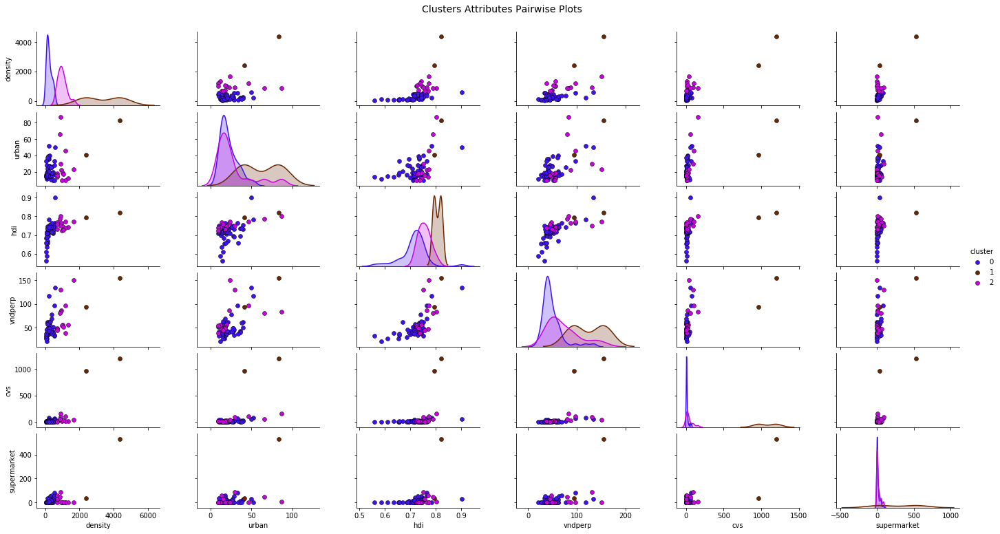

In [149]:
# create color code for different cluster
import random
clustertype=result.cluster.unique()
color={}

for i in range(len(clustertype)):
    #print(area[i])
    color[clustertype[i]]="#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
    #print(color[area[i]])

# Scatter Plot with Hue for visualizing data in 3-D
cols = ['density','urban','hdi','vndperp','cvs','supermarket','cluster']
pp = sns.pairplot(result[cols], hue='cluster', size=1.8, aspect=1.8, 
                  palette=color,
                  plot_kws=dict(edgecolor="black", linewidth=0.5))
fig = pp.fig 
fig.subplots_adjust(top=0.93, wspace=0.3)
t = fig.suptitle('Clusters Attributes Pairwise Plots', fontsize=14)

In [159]:
print(color)

{1: '#6B2700', 2: '#C504DE', 0: '#4112F0'}


Text(0.5, 1.05, 'Population density - GDRP/person - Cluster')

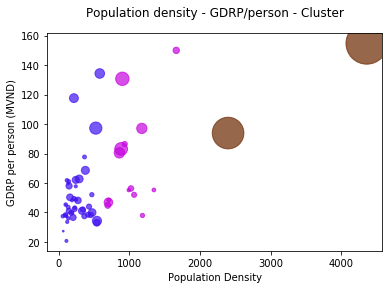

In [163]:
# Visualizing 4-D mix data using bubble plots
# leveraging the concepts of hue and size
size = result['countstores']
fill_colors = ['#6B2700' if cluster==1 else '#C504DE' if cluster==2 else '#4112F0' for cluster in list(result['cluster'])]
edge_colors = ['#6B2700' if cluster==1 else '#C504DE' if cluster==2 else '#4112F0' for cluster in list(result['cluster'])]

plt.scatter(result['density'], result['vndperp'], s=size, 
            alpha=0.7, color=fill_colors, edgecolors=edge_colors)

plt.xlabel('Population Density')
plt.ylabel('GDRP per person (MVND)')
plt.title('Population density - GDRP/person - Cluster',y=1.05)

In [118]:
retail=result.copy()

retail['cluster'] = retail['cluster'].astype('category')

#change city name to match json file
retail['json_name']=result['province']
retail.loc[retail.province[retail.province == 'Ho Chi Minh'].index.tolist(),'json_name']='TP. Ho Chi Minh'
retail.loc[retail.province[retail.province == 'Thua Thien Hue'].index.tolist(),'json_name']='Thua Thien - Hue'
retail.loc[retail.province[retail.province == 'Ba Ria Vung Tau'].index.tolist(),'json_name']='Ba Ria - Vung Tau'

import seaborn as sns
import folium
import os
import json
import requests

#address= 'Vietnam'
#geolocator = Nominatim()
#location = geolocator.geocode(address)

vn=folium.Map(
    location=[13.2904027, 108.4265113],
    zoom_start=5,
    title='Vietnam')

url = 'https://data.opendevelopmentmekong.net/dataset/999c96d8-fae0-4b82-9a2b-e481f6f50e12/resource/2818c2c5-e9c3-440b-a9b8-3029d7298065/download/diaphantinhenglish.geojson'
vn_geo=json.loads(requests.get(url).text)

vn.choropleth(
    geo_data=vn_geo,
    data=retail,
    columns=['json_name','cluster'],
    key_on='feature.properties.Name',
    fill_color='OrRd', 
    fill_opacity=0.75, 
    line_opacity=0.2,
    legend_name='Cluster',
    threshold_scale=[0, 1, 2, 3])
vn

/Users/lbpham/anaconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [169]:
cluster2=result.loc[result.cluster==2]
cluster2=cluster2[['province','region','vndperp','population','area','density','urban','hdi','supermarket','cvs','countstores']]
cluster2

,province,region,vndperp,population,area,density,urban,hdi,supermarket,cvs,countstores
1,Vinh Phuc,Red River Delta,86.50,1154154.0,1235.2,934.0,22.4,0.764,2.0,25.0,27.0
2,Bac Ninh,Red River Delta,150.10,1368840.0,822.7,1664.0,23.5,0.771,0.0,41.0,41.0
4,Hai Duong,Red River Delta,56.30,1705059.0,1668.2,1022.0,19.0,0.746,3.0,28.0,31.0
5,Hai Phong,Red River Delta,97.10,1837173.0,1561.8,1176.0,46.1,0.773,3.0,103.0,106.0
6,Hung Yen,Red River Delta,55.30,1252731.0,930.2,1347.0,12.1,0.743,0.0,14.0,14.0
7,Thai Binh,Red River Delta,38.00,1860447.0,1570.5,1185.0,9.7,0.738,1.0,17.0,18.0
8,Ha Nam,Red River Delta,55.20,852800.0,860.9,991.0,9.5,0.724,0.0,12.0,12.0
9,Nam Dinh,Red River Delta,52.00,1780393.0,1668.0,1067.0,17.6,0.726,2.0,24.0,26.0
10,Ninh Binh,Red River Delta,48.50,982487.0,1387.0,708.0,17.9,0.733,3.0,12.0,15.0
31,Da Nang,South Central Coast,83.16,1134310.0,1284.9,883.0,86.9,0.803,4.0,160.0,164.0
